# Customer Personality Analysis

## Context

### Context of Dataframe

Customer personality analysis is an essential process for any business aiming to gain a deeper understanding of its customer base. This comprehensive examination enables a company to grasp the intricacies of its customers' preferences, behaviors, and concerns, ultimately facilitating the customization of products and services to cater to the diverse needs of various customer segments.

By conducting a customer personality analysis, a business can efficiently adapt its offerings to align with the preferences and characteristics of distinct customer groups. This strategic approach allows the company to optimize its marketing efforts and allocate resources wisely. Rather than indiscriminately promoting a new product to all customers in its database, the company can identify the customer segment most likely to be interested in the product and target its marketing campaigns specifically to that segment.

In summary, customer personality analysis empowers businesses to refine their product development, marketing strategies, and overall customer engagement by recognizing and addressing the unique traits and preferences of different customer segments.

# Exploring Customer Personalities with K-Means Clustering

Welcome to our exciting journey into the world of customer personalities! In this repository, we're going to dive into the fascinating realm of the Customer Personality Analysis dataset. But hold on to your seats because it's not just about analyzing data; it's about unlocking the secrets of customer behavior using K-Means clustering.

## What to Expect

- **Discover Hidden Patterns**: We'll unravel hidden patterns in customer data using K-Means clustering, a powerful technique that groups similar customers together.

- **Reduce Dimensions with PCA**: We'll use Principal Component Analysis (PCA) to simplify our data and make it more manageable without losing critical information.

- **Evaluate Clusters**: Ever heard of silhouette scores, Calinski-Harabasz scores, and Davies-Bouldin scores? We'll dive into these metrics to assess the quality of our clusters.

- **Normalize Data**: We'll explore two techniques, Min-Max Scaling and Z-Score normalization, to ensure our data is primed for clustering.

It's not just about data; it's about uncovering the stories hidden within it. Join us on this exhilarating journey through customer personalities and data-driven insights!

---

If you're interested in exploratory analysis and visualization, you can find it in my other repository **"Data_analysis(EDA).ipynb"**. In that repository, we delve deeper into exploratory data analysis (EDA). However, here in this repository, we'll focus more on the modeling part.


# Code

### Libraries Used

In this analysis, we make use of several powerful libraries and packages to handle data, perform analysis, and visualize results:

- **numpy (np)**: NumPy is a fundamental library for scientific computing in Python. It provides support for arrays, mathematical functions, and operations, making it essential for data manipulation.

- **pandas (pd)**: Pandas is a versatile data manipulation library that offers data structures like DataFrames and Series, along with a plethora of functions for data cleaning, transformation, and analysis.

- **matplotlib.pyplot (plt)**: Matplotlib is a popular plotting library that allows us to create a wide range of static, animated, or interactive visualizations in Python.

- **seaborn (sns)**: Seaborn is built on top of Matplotlib and provides a high-level interface for creating aesthetically pleasing statistical graphics. It's particularly useful for creating informative and attractive visualizations.

- **MinMaxScaler**: This is a class from the scikit-learn library (sklearn) used for feature scaling, specifically min-max scaling. It scales the features to a specified range (usually between 0 and 1), which is crucial for certain machine learning algorithms.

- **PCA (Principal Component Analysis)**: PCA is part of scikit-learn and is used for dimensionality reduction. It helps reduce the number of features while preserving the most critical information.

- **KMeans**: Another scikit-learn tool, KMeans is a clustering algorithm that partitions data into groups based on similarities. It's commonly used for customer segmentation and other clustering tasks.

- **silhouette_score, calinski_harabasz_score, davies_bouldin_score**: These are evaluation metrics from scikit-learn used to assess the quality and effectiveness of clustering algorithms. Silhouette score measures the separation between clusters, Calinski-Harabasz score measures the ratio of between-cluster variance to within-cluster variance, and Davies-Bouldin score measures the average similarity ratio between each cluster and its most similar cluster.

- **zscore**: This function from the scipy.stats library calculates the Z-score, which is a measure of how far away a particular data point is from the mean. It's often used in data preprocessing and outlier detection.

These libraries and tools play a vital role in our analysis, helping us explore data, perform clustering, and evaluate the results effectively.


In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from scipy.stats import zscore

### Loading the Dataframe

In [32]:
df = pd.read_csv("marketing_campaign.csv", sep="\t")

In [33]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


### Cheking The null values and Duplicate

In [34]:
# Check for missing values
missing_values = df.isna().sum()
print("Missing values:\n", missing_values)

# Drop rows with missing values
df = df.dropna()



Missing values:
 ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64


In [35]:
# Check if there are any duplicate rows in the dataframe
has_duplicate_rows = df.duplicated().any()

# Remove duplicate rows, if any
if has_duplicate_rows:
    df = df.drop_duplicates()

In [38]:
df["Dt_Customer"] = pd.to_datetime(df["Dt_Customer"])
df["Age"] = 2023 - df["Year_Birth"]
df['Spent_Total'] = df[['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']].sum(axis=1)
df["marital_classification"] = df["Marital_Status"].map({"Married": 1, "Together": 1, "Absurd": 0, "Widow": 0, "YOLO": 0, "Divorced": 0, "Single": 0}).astype("category")
df["Education_Class"] = df["Education"].map({"Basic": 0, "Graduation": 1, "2n Cycle": 3, "Master": 4, "PhD": 3}).astype("category")
df["Dependents"] = df["Teenhome"] + df["Kidhome"]
df['Num_Accepted_Cmp'] = df[['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response']].sum(axis=1)

We have introduced several new variables to enhance our understanding of the dataset and facilitate the development of cluster models. Let's provide a concise explanation of each new variable:

**Age**: We calculated the age of each customer based on their birth year to gain insights into the age distribution of our customer base.

**Spent_Total**: This variable represents the total amount spent by each customer across different product categories, including wines, fruits, meat products, fish products, sweets, and gold. It helps us understand the overall spending behavior of customers.

**Marital_Classification**: We categorized customers into two groups: "Married" or "Together" as 1 (indicating a partnership) and other marital statuses ("Absurd," "Widow," "YOLO," "Divorced," "Single") as 0. This binary variable simplifies marital status for analysis.

**Education_Class: We categorized customers**' education levels into numerical values (0 to 4), with "Basic" as 0, "Graduation" as 1, "2n Cycle" and "PhD" as 3, and "Master" as 4. This categorical variable provides a simplified representation of education.

**Dependents**: This variable represents the total number of dependents in a customer's household, including teenagers and children. It offers insights into family size.

**Num_Accepted_Cmp**: We computed the total number of marketing campaigns accepted by each customer. This variable aggregates the acceptance of various marketing campaigns, helping us gauge customer responsiveness.

By introducing these new variables, we have enriched our dataset with valuable insights that can aid in data exploration, clustering, and other analytical tasks. These variables provide a more holistic view of customer characteristics and behaviors, contributing to a more comprehensive analysis of the dataset.

### Remove outliers using z-score

In [39]:
z_scores = zscore(df[['Age', 'Income']])
outlier_mask = (z_scores.abs() < 3).all(axis=1)
df = df[outlier_mask]

**What it Does**

In this code snippet, we perform the following operations:

1. **Z-Score Calculation**: We calculate the Z-scores for two specific columns, 'Age' and 'Income', using the `zscore` function from the `scipy.stats` library. Z-scores measure how far each data point is from the mean in terms of standard deviations.

2. **Outlier Detection**: We create an `outlier_mask` that checks if the absolute Z-scores for both 'Age' and 'Income' are less than 3 standard deviations from the mean. A threshold of 3 is commonly used to identify outliers, but it can be adjusted as needed to suit the specific data and analysis.

3. **Data Filtering**: We filter the original DataFrame `df` using the `outlier_mask`, keeping only the rows that meet the outlier criteria. This effectively removes or mitigates the impact of outliers in our dataset.

**Why it Matters**

Identifying and handling outliers is a crucial step in data preprocessing. Outliers have the potential to significantly skew statistical analyses and machine learning models, leading to inaccurate results. By applying this code, we ensure that our dataset is more robust and suitable for subsequent analysis, reducing the influence of extreme values.

This code snippet provides a practical solution for outlier detection and removal, enhancing the quality and reliability of our data analysis. It can be easily customized and applied to various datasets to improve data integrity.


### Remove unnecessary columns

In [ ]:
columns_to_drop = ['Year_Birth', 'ID', 'Education', 'Z_CostContact', 'Z_Revenue', 'Dt_Customer', 'Marital_Status', 'Dependents', 'Num_Accepted_Cmp', 'Spent_Total']
df.drop(columns_to_drop, axis=1, inplace=True)

**What it Does**

In this code block, we streamline our dataset by removing unnecessary columns from the DataFrame `df`. The columns selected for removal are as follows:

- `Year_Birth`: Customer birth year, which may not be relevant for our analysis.
- `ID`: Customer identifiers, which are not needed for our current task.
- `Education`: Customer education level, if not crucial for our analysis.
- `Z_CostContact` and `Z_Revenue`: These columns appear to be constants, which add no variability to our data.
- `Dt_Customer`: Date of customer enrollment, which may not be required for this analysis.
- `Marital_Status`: Customer marital status, if not directly relevant.
- `Dependents`: Information about dependents, which may not be essential for our current focus.
- `Num_Accepted_Cmp`: A column with unspecified content, possibly not relevant.
- `Spent_Total`: Total spending, which might be calculated or represented differently.

By removing these columns using the `drop` method with `axis=1`, we clean up our dataset, making it more concise and focused on the key variables of interest.

**Why it Matters**

Data cleanup, including the removal of unnecessary columns, is a crucial step in data preprocessing. It helps reduce noise, simplify analysis, and improve the efficiency of subsequent tasks such as modeling and visualization. This code ensures that our dataset contains only the most relevant information for our specific analysis.


In [44]:
df.head()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,marital_classification,Education_Class
0,58138.0,0,0,58,635,88,546,172,88,88,...,0,0,0,0,0,0,1,66,0.0,1
1,46344.0,1,1,38,11,1,6,2,1,6,...,0,0,0,0,0,0,0,69,0.0,1
2,71613.0,0,0,26,426,49,127,111,21,42,...,0,0,0,0,0,0,0,58,1.0,1
3,26646.0,1,0,26,11,4,20,10,3,5,...,0,0,0,0,0,0,0,39,1.0,1
4,58293.0,1,0,94,173,43,118,46,27,15,...,0,0,0,0,0,0,0,42,1.0,3


### Apply feature scaling using MinMaxScaler

In [50]:
scaler = MinMaxScaler()
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
df_scaled = df.copy()
df_scaled[numeric_cols] = scaler.fit_transform(df[numeric_cols])

**What it Does**

In this code segment, we perform a crucial data preprocessing step known as feature scaling using the `MinMaxScaler`. The process consists of the following key steps:

1. **Scaler Initialization**: We create a `MinMaxScaler` object named `scaler`. This scaler is used to transform our numeric features so that they fall within a specific range.

2. **Identifying Numeric Columns**: We identify the numeric columns in our DataFrame `df` using the `select_dtypes` method with the argument `include=['int64', 'float64']`. These columns are typically the ones containing numerical data.

3. **DataFrame Copy**: We create a copy of our original DataFrame `df` named `df_scaled`. This copy ensures that the original data remains intact while we apply scaling to a new DataFrame.

4. **Scaling**: We use the `fit_transform` method of the `MinMaxScaler` to scale the numeric columns in `df_scaled`. This scaling operation transforms the numeric values to fall within a specific range, often between 0 and 1, ensuring that all features have equal influence in subsequent analyses.

**Why it Matters**

Feature scaling is essential in data preprocessing, particularly when working with machine learning models that are sensitive to the scale of input features. By scaling the features using the `MinMaxScaler`, we ensure that the magnitude of different features doesn't affect the performance of our models negatively. This preprocessing step enhances the model's stability and the accuracy of its predictions by bringing all features to a consistent scale.


###  Determine the necessary number of principal components using explained variance ratio

In [51]:
pca = PCA(n_components=None)
df_pca = pca.fit_transform(df_scaled[numeric_cols])

explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

**What it Does**

In this code segment, we perform Principal Component Analysis (PCA) on our scaled numeric data to reduce dimensionality and gain insights into the variability of our features. The code accomplishes the following:

1. **PCA Initialization**: We create a PCA object named `pca` with the parameter `n_components=None`. Setting `n_components` to `None` implies that PCA will retain all principal components.

2. **Data Transformation**: We apply PCA to the scaled numeric columns of our DataFrame `df_scaled`. The result is a new DataFrame named `df_pca`, where the original features have been transformed into a set of linearly uncorrelated variables known as principal components.

3. **Explained Variance Ratio**: We calculate the explained variance ratio for each principal component. The `explained_variance_ratio_` attribute of the PCA object contains these ratios. It indicates the proportion of the total variance in the data that each principal component explains.

4. **Cumulative Variance Ratio**: We compute the cumulative explained variance ratio. This helps us understand how much of the total variance is explained as we consider an increasing number of principal components. It's useful for selecting an appropriate number of components that retain a significant portion of the variance.

**Why it Matters**

PCA is a dimensionality reduction technique that helps simplify complex datasets while retaining as much relevant information as possible. By analyzing the explained variance ratios and cumulative variance ratio, we can make informed decisions about how many principal components to keep. This step is essential in reducing the dimensionality of the data, speeding up computations, and maintaining the most critical aspects of the original information in our analysis.


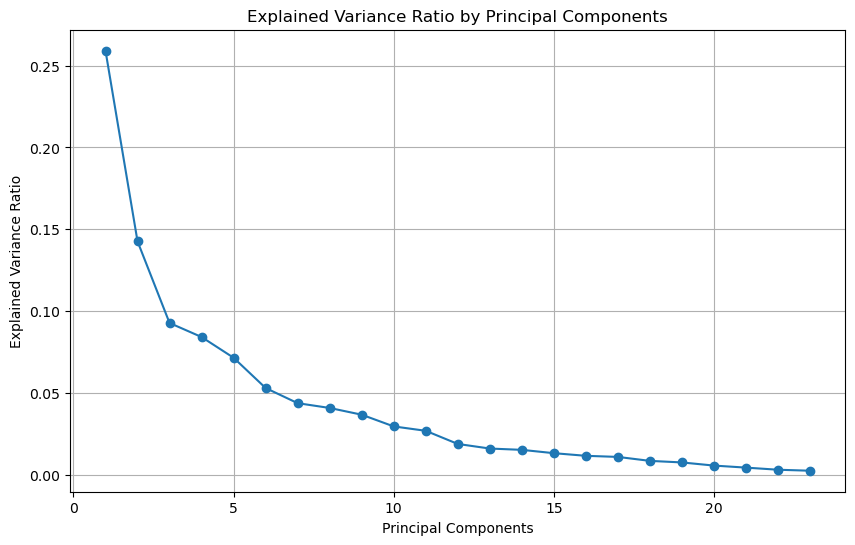

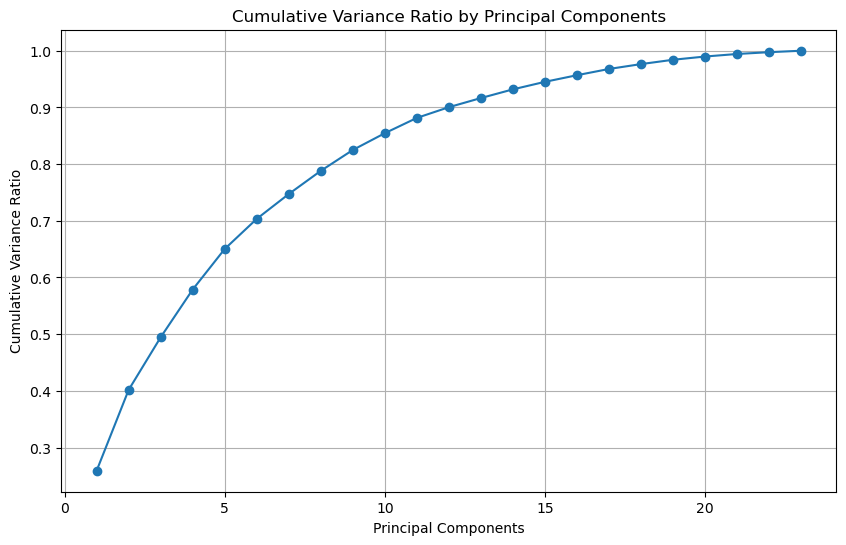

In [52]:
# Plot the explained variance ratio and cumulative variance ratio
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, 'o-')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Components')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, 'o-')
plt.xlabel('Principal Components')
plt.ylabel('Cumulative Variance Ratio')
plt.title('Cumulative Variance Ratio by Principal Components')
plt.grid(True)
plt.show()

In [53]:
# Choose the number of principal components based on the desired variance explained
desired_variance_explained = 0.95
n_components = np.argmax(cumulative_variance_ratio >= desired_variance_explained) + 1
print(f"Number of Principal Components to explain {desired_variance_explained * 100}% variance: {n_components}")

Number of Principal Components to explain 95.0% variance: 16


**What it Does**

In this code block, we make a critical decision about the number of principal components to retain based on a desired level of explained variance. The code achieves the following:

1. **Desired Variance Explained**: We specify a desired level of variance to explain, which is set to 95% in this case. This means we want our principal components to co# Perform PCA with the chosen number of components
pca = PCA(n_components=n_components)
df_reduced = pca.fit_transform(df_scaled[numeric_cols])llectively account for at least 95% of the total variance in the data.

2. **Number of Components Calculation**: We calculate the number of principal components required to explain the desired variance by finding the index where the cumulative variance ratio (cumulative explained variance) first exceeds or equals the desired variance (95%). This number is stored in the variable `n_components`.

3. **Displaying the Result**: We print the result, indicating the number of principal components needed to explain the desired variance. In this specific case, it's found to be 16 components.

**Why it Matters**

Choosing the right number of principal components is crucial in PCA. It balances the need to reduce dimensionality with the goal of retaining as much relevant information as possible. In this code, we've used a threshold of 95% explained variance, meaning our selected components capture the majority of the variability in the data. This ensures that our reduced dataset still retains a significant portion of the original information, making it suitable for further analysis or modeling.


In [54]:
# Perform PCA with the chosen number of components
pca = PCA(n_components=n_components)
df_reduced = pca.fit_transform(df_scaled[numeric_cols])

C:\Users\Charles\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\Charles\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\Charles\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\Charles\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\Charles\anaconda3\lib\site-packages\skl

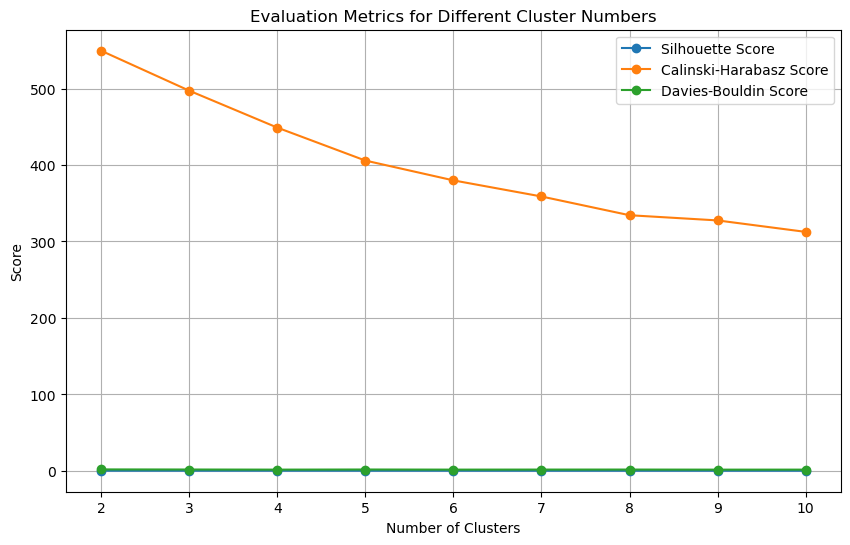

In [55]:
# Determine the ideal number of clusters using multiple methods and compare their results
num_clusters_range = range(2, 11)
silhouette_scores = []
calinski_scores = []
davies_bouldin_scores = []

for k in num_clusters_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(df_reduced)

    silhouette_scores.append(silhouette_score(df_reduced, cluster_labels))
    calinski_scores.append(calinski_harabasz_score(df_reduced, cluster_labels))
    davies_bouldin_scores.append(davies_bouldin_score(df_reduced, cluster_labels))

# Plot the evaluation metrics for different cluster numbers
plt.figure(figsize=(10, 6))
plt.plot(num_clusters_range, silhouette_scores, 'o-', label='Silhouette Score')
plt.plot(num_clusters_range, calinski_scores, 'o-', label='Calinski-Harabasz Score')
plt.plot(num_clusters_range, davies_bouldin_scores, 'o-', label='Davies-Bouldin Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Evaluation Metrics for Different Cluster Numbers')
plt.legend()
plt.grid(True)
plt.show()

In [57]:
# Create a DataFrame to store the evaluation metrics
metrics_df = pd.DataFrame({
    'Number of Clusters': list(num_clusters_range),
    'Silhouette Score': silhouette_scores,
    'Calinski-Harabasz Score': calinski_scores,
    'Davies-Bouldin Score': davies_bouldin_scores
})

# Display the DataFrame as a table
print(metrics_df)

   Number of Clusters  Silhouette Score  Calinski-Harabasz Score  \
0                   2          0.228034               549.514984   
1                   3          0.221616               497.271121   
2                   4          0.229953               448.968370   
3                   5          0.194933               405.864743   
4                   6          0.195925               379.927226   
5                   7          0.177286               358.880495   
6                   8          0.182967               334.352901   
7                   9          0.190978               327.555559   
8                  10          0.191541               312.556709   

   Davies-Bouldin Score  
0              1.881796  
1              1.756901  
2              1.613859  
3              1.765110  
4              1.619013  
5              1.678176  
6              1.698838  
7              1.592586  
8              1.615678  


**What it Does**

In this code segment, we determine the ideal number of clusters for our data using multiple evaluation methods and compare their results. The code accomplishes the following:

1. **Cluster Range Definition**: We specify a range of potential cluster numbers from 2 to 10 (`num_clusters_range`). This range represents the different numbers of clusters we want to test for our dataset.

2. **Initialization of Evaluation Metrics Lists**: We initialize empty lists (`silhouette_scores`, `calinski_scores`, and `davies_bouldin_scores`) to store the evaluation scores for each cluster number.

3. **Loop Over Cluster Numbers**: We iterate through the cluster numbers in the specified range. For each cluster number `k`:
   - We create a K-Means clustering model (`kmeans`) with `k` clusters and a random seed (`random_state`) for reproducibility.
   - We fit the model to our reduced dataset (`df_reduced`) and obtain cluster labels for each data point.
   - We calculate and store three evaluation metrics for clustering:
     - Silhouette Score: Measures how similar each data point is to its own cluster compared to other clusters.
     - Calinski-Harabasz Score: Evaluates the ratio of between-cluster variance to within-cluster variance.
     - Davies-Bouldin Score: Quantifies the average similarity ratio between each cluster and its most similar cluster.

4. **Plotting Evaluation Metrics**: We create a plot to visualize the three evaluation metrics across different cluster numbers. The x-axis represents the number of clusters, and the y-axis represents the corresponding scores. This plot helps us identify the optimal number of clusters based on these metrics.

**Why it Matters**

Selecting the right number of clusters is a critical step in clustering analysis. This code systematically evaluates multiple cluster numbers and compares them using different metrics. By visualizing and comparing these metrics, we can make an informed decision about the ideal number of clusters that best represents the underlying structure of our data. This ensures that our clustering analysis is meaningful and accurate.


In [56]:
# Determine the ideal number of clusters based on the highest silhouette score
ideal_num_clusters_silhouette = num_clusters_range[np.argmax(silhouette_scores)]
print(f"Ideal number of clusters (Silhouette Score): {ideal_num_clusters_silhouette}")

# Determine the ideal number of clusters based on the highest Calinski-Harabasz score
ideal_num_clusters_calinski = num_clusters_range[np.argmax(calinski_scores)]
print(f"Ideal number of clusters (Calinski-Harabasz Score): {ideal_num_clusters_calinski}")

# Determine the ideal number of clusters based on the lowest Davies-Bouldin score
ideal_num_clusters_davies_bouldin = num_clusters_range[np.argmin(davies_bouldin_scores)]
print(f"Ideal number of clusters (Davies-Bouldin Score): {ideal_num_clusters_davies_bouldin}")

Ideal number of clusters (Silhouette Score): 4
Ideal number of clusters (Calinski-Harabasz Score): 2
Ideal number of clusters (Davies-Bouldin Score): 9


**What it Does**

In this code section, we determine the ideal number of clusters based on three different evaluation metrics: Silhouette Score, Calinski-Harabasz Score, and Davies-Bouldin Score. The code accomplishes the following:

1. **Silhouette Score Analysis**: We identify the ideal number of clusters by selecting the one that results in the highest Silhouette Score. The Silhouette Score measures how similar each data point is to its own cluster compared to other clusters. The cluster number with the highest Silhouette Score is stored in `ideal_num_clusters_silhouette`.

2. **Calinski-Harabasz Score Analysis**: Similarly, we determine the ideal number of clusters based on the highest Calinski-Harabasz Score. This score evaluates the ratio of between-cluster variance to within-cluster variance. The cluster number with the highest Calinski-Harabasz Score is stored in `ideal_num_clusters_calinski`.

3. **Davies-Bouldin Score Analysis**: We also find the ideal number of clusters by selecting the one that results in the lowest Davies-Bouldin Score. This score quantifies the average similarity ratio between each cluster and its most similar cluster. The cluster number with the lowest Davies-Bouldin Score is stored in `ideal_num_clusters_davies_bouldin`.

4. **Displaying the Results**: Finally, we print out the ideal numbers of clusters determined by each of the three metrics.

**Why it Matters**

Determining the ideal number of clusters is a critical step in clustering analysis. Different evaluation metrics may provide varying insights into the optimal cluster count. By considering multiple metrics, we gain a more comprehensive understanding of the data's clustering structure. The code helps us make an informed decision about the number of clusters that best suit our specific analysis, whether it's based on maximizing separation (Silhouette Score), variance ratios (Calinski-Harabasz Score), or minimizing similarity ratios (Davies-Bouldin Score).


In [70]:
# Prompt the user to enter the desired number of clusters
desired_num_clusters = int(input("Enter the desired number of clusters: "))

Enter the desired number of clusters:  2


In [71]:
# Perform clustering with the chosen number of clusters
kmeans = KMeans(n_clusters=desired_num_clusters, random_state=42)
kmeans.fit(df_reduced)
cluster_labels = kmeans.labels_

C:\Users\Charles\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [73]:
# Assign the cluster labels to the original dataframe
df_clustered = df.copy()
df_clustered['Cluster'] = cluster_labels

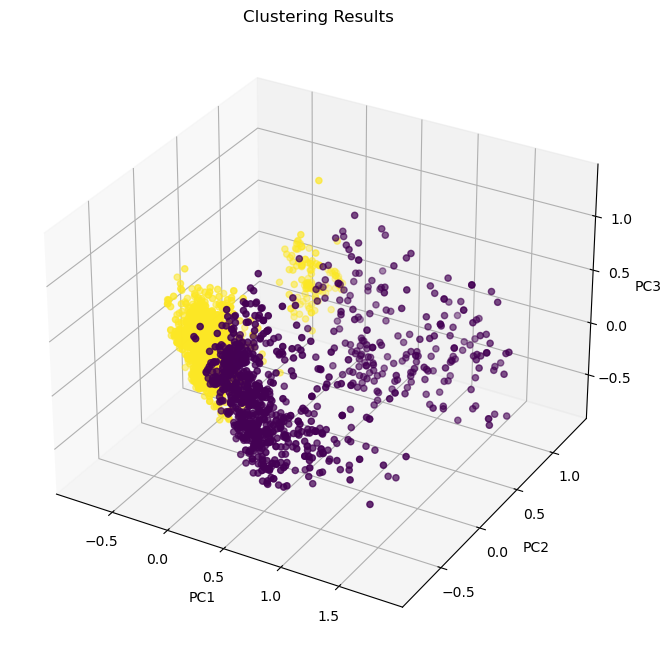

In [74]:
# Visualize the clusters in 3D space
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_reduced[:, 0], df_reduced[:, 1], df_reduced[:, 2], c=cluster_labels, cmap='viridis')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
plt.title('Clustering Results')
plt.show()

In [75]:
cluster_stats = df_clustered.groupby('Cluster').mean()
print(cluster_stats)

               Income   Kidhome  Teenhome    Recency    MntWines  MntFruits  \
Cluster                                                                       
0        70330.659664  0.058824  0.470588  49.405462  598.754202  52.694328   
1        37407.766161  0.733440  0.533919  48.707901   83.861931   6.427773   

         MntMeatProducts  MntFishProducts  MntSweetProducts  MntGoldProds  \
Cluster                                                                     
0             334.507353        74.840336         54.085084     72.580882   
1              36.761373         9.581006          6.647247     22.385475   

         ...  NumStorePurchases  NumWebVisitsMonth  AcceptedCmp3  \
Cluster  ...                                                       
0        ...           8.584034           3.866597      0.078782   
1        ...           3.726257           6.454110      0.070231   

         AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  AcceptedCmp2  Complain  \
Cluster                 

ValueError: num must be 1 <= num <= 6, not 7

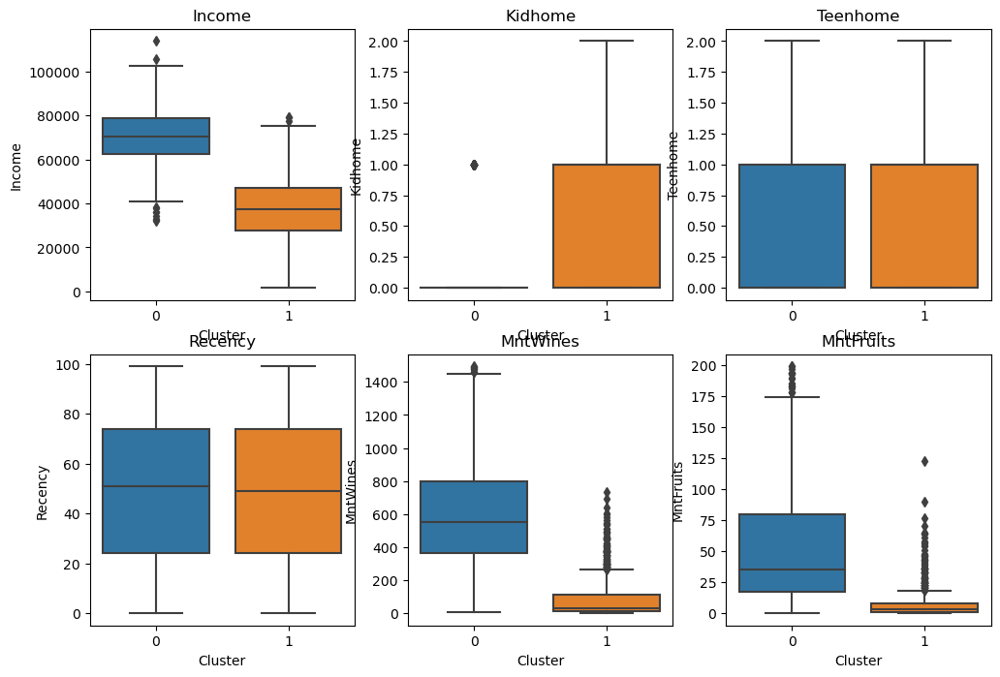

In [76]:
# Example code to create box plots for each numeric variable grouped by clusters
plt.figure(figsize=(12, 8))
for col in numeric_cols:
    plt.subplot(2, 3, numeric_cols.get_loc(col) + 1)
    sns.boxplot(x='Cluster', y=col, data=df_clustered)
    plt.title(col)
plt.tight_layout()
plt.show()

ValueError: num must be 1 <= num <= 6, not 7

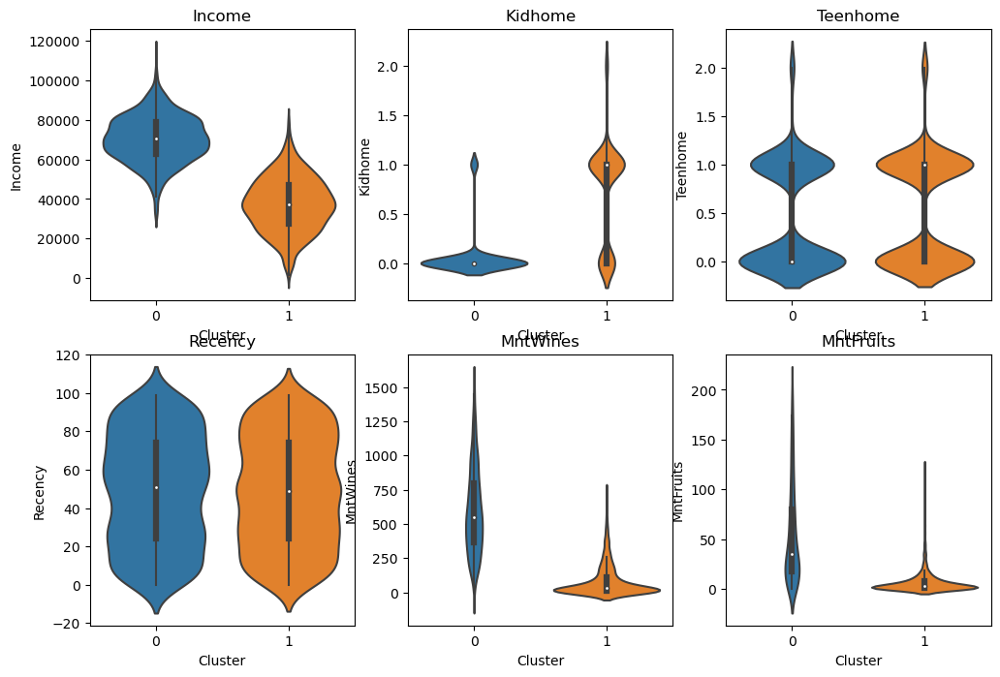

In [77]:
plt.figure(figsize=(12, 8))
for col in numeric_cols:
    plt.subplot(2, 3, numeric_cols.get_loc(col) + 1)
    sns.violinplot(x='Cluster', y=col, data=df_clustered)
    plt.title(col)
plt.tight_layout()
plt.show()

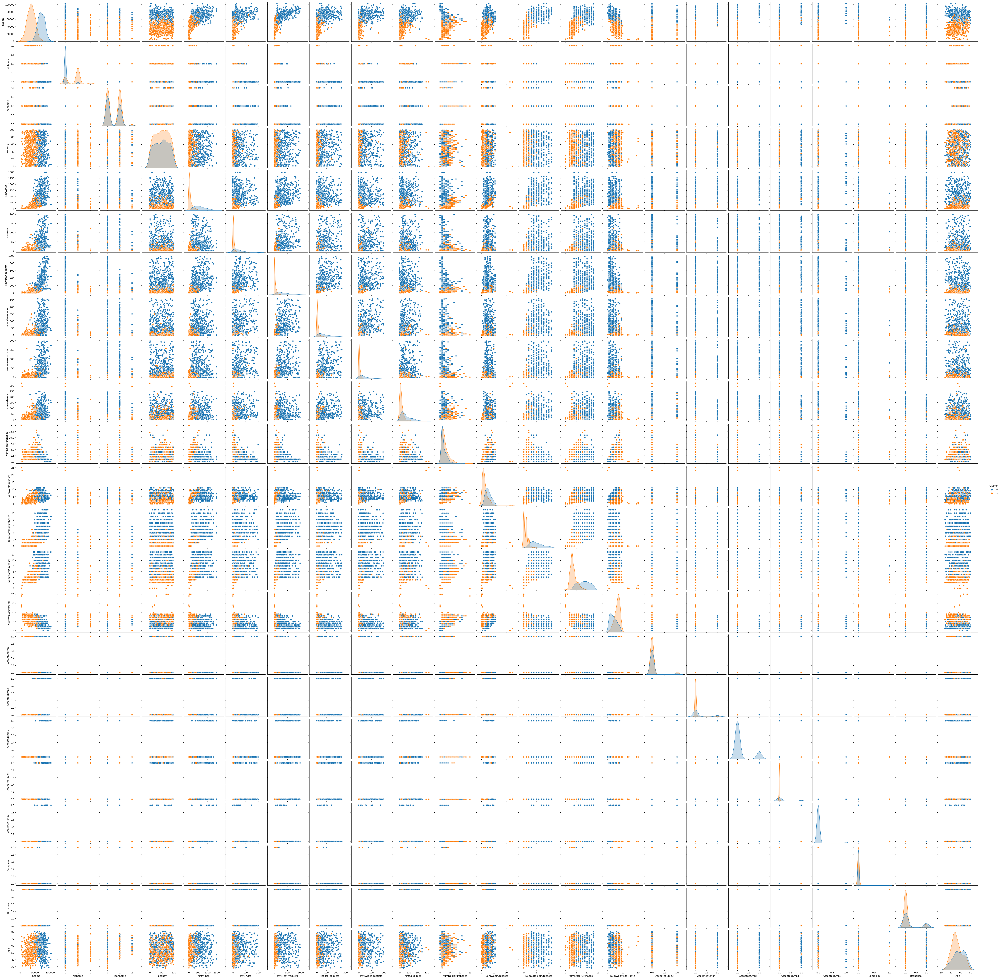

In [78]:
# Example code to create pair plots for variables within each cluster
df_pairplot = df_clustered.sample(n=1000)  # Subset the data for faster plotting
df_pairplot['Cluster'] = df_pairplot['Cluster'].astype(str)  # Convert Cluster to string for plotting
sns.pairplot(df_pairplot, hue='Cluster')
plt.show()